### IMPORTS AND INSTALLATIONS

In [2]:
# Install Dependancies and Frameworks
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.7 kB)
  Using cached nvidia_nvjitlink_cu12-12.6.20-py3-none-manyl

In [1]:
# Mounting GDrive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# Importing Packages and Libraries
# Common Utilities
import sys, os, distutils.core
import torch, detectron2, torchvision
import numpy as np
import os, json, cv2, random
import yaml
from matplotlib import pyplot as plt


In [2]:
# Detectron2 Utilities
from detectron2 import *
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [3]:
# GPU and Version Check
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("Torch: ", TORCH_VERSION)
print("Cuda: ", CUDA_VERSION)
print("Detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
Torch:  2.4
Cuda:  cu121
Detectron2: 0.6


### DATA LOADING

In [4]:
# Setup File Path

# Path to any sample image in training data
SAMPLE_IMG_PATH = "/content/drive/MyDrive/Building_Footprint_Extraction/data/train/13.png"
# Path to folder containg training data
ROOT_DIR = "/content/drive/MyDrive/Building_Footprint_Extraction/data/train"
# Path to folder containing training data (same as ROOT_DIR)
TRAIN_DATA_PATH = "/content/drive/MyDrive/Building_Footprint_Extraction/data/train"
# Path to training annotations
TRAIN_ANNOTATION_PATH = "/content/drive/MyDrive/Building_Footprint_Extraction/data/train/train_label.json"
# Path to save model results - weights, config, metrics, logs etc
OUTPUT_DIR = "/content/drive/MyDrive/Building_Footprint_Extraction/model_results"
# Path to save model configuration (should be inside OUTPUT_DIR only)
CONFIG_FILE_PATH = "/content/drive/MyDrive/Building_Footprint_Extraction/model_results/custom_cfg.yaml"

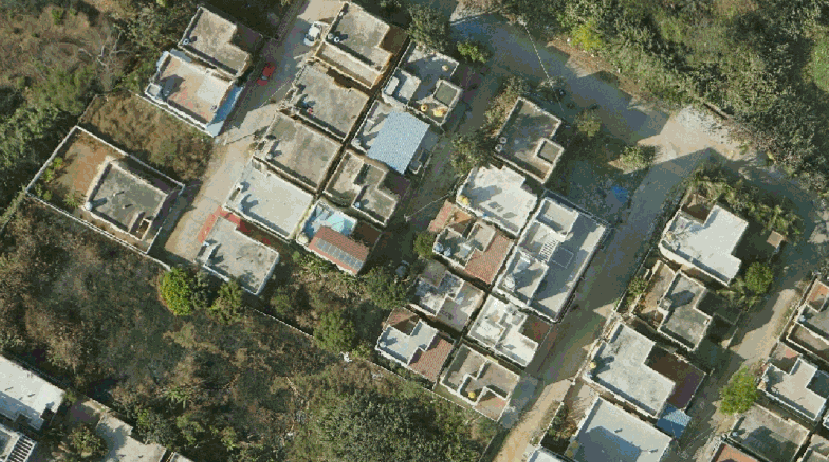

In [5]:
# Sample Image Visualization
from google.colab.patches import cv2_imshow
img_path = SAMPLE_IMG_PATH
img = cv2.imread(img_path)
cv2_imshow(img)

In [ ]:
"""
  Overall worklow for inference (getting result prediction from the model)
      1. Initiate the config object(cfg) with default parameters
      2. Fetch the cfg defaults for the particular model required from the model zoo
      3. Initiate the DefaultPredictor object
      4. Pass the required data into the Predictor object
      5. The output variable contains the output instances(detcted objects, segmentation masks)
"""

[08/08 00:53:30 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from detectron2://ImageNetPretrained/MSRA/R-50.pkl ...


R-50.pkl: 102MB [00:01, 74.4MB/s]                           

[08/08 00:53:31 d2.checkpoint.c2_model_loading]: Renaming Caffe2 weights ......


[08/08 00:53:31 d2.checkpoint.c2_model_loading]: Following weights matched with submodule backbone.bottom_up - Total num: 54


backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.deconv.{bias, weight}
roi_heads.mask_head.mask_fcn1.{bias, weight}
roi_heads.mask_head.mask_fcn2.{bias, weight}
roi_heads.mask_head.mask_fcn3.{bias, weight}
roi_heads.mask_head.mask_fcn4.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
  fc1000.{bias, weight}
  stem.conv1.bias
/usr/local/lib/python3.10/dist-packages/torch/functional.py

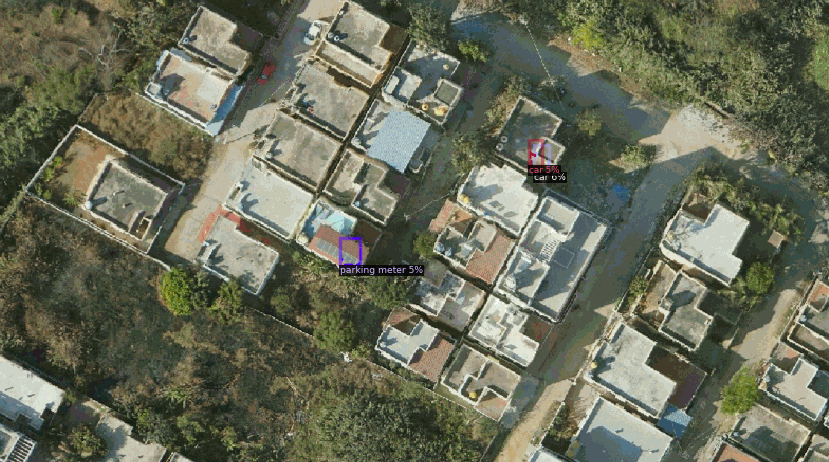

In [7]:
# Testing the model with no fine tuning on this pre-trained model
cfg = get_cfg()
#cfg.MODEL.DEVICE = "cpu"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
predictor = DefaultPredictor(cfg)
img = cv2.imread(SAMPLE_IMG_PATH)
output = predictor(img)
img_vis = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0])) # Converts the image from BGR (OpenCV format) to RGB (as expected by the Visualizer in detectron2)
mask_output = img_vis.draw_instance_predictions(output["instances"].to("cpu"))
cv2_imshow(mask_output.get_image()[:, :, ::-1])

In [8]:
"""
  The convention for detectron2 model while using our custom dataset to finetune is that to "Register the Dataset".
  Registering the dataset means to make it compatible with the detectron model.
  They are registered here in the form of COCO data Instances
"""
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train_data", {}, TRAIN_ANNOTATION_PATH, TRAIN_DATA_PATH)

In [9]:
# Loading training metadata into dicts(dictionary)
# dicts contain the corresponding image and its annotations

train_metadata = MetadataCatalog.get("train_data")
train_dataset_dicts = DatasetCatalog.get("train_data")

[08/08 00:53:47 d2.data.datasets.coco]: Loaded 18 images in COCO format from /content/drive/MyDrive/Building_Footprint_Extraction/data/train/train_label.json


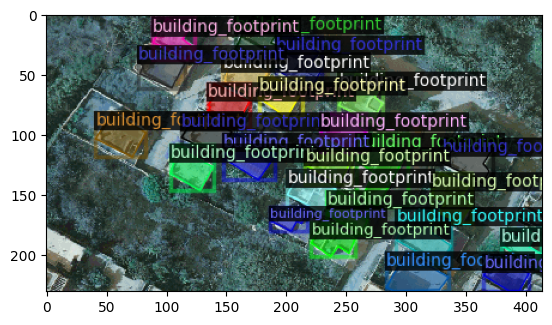

In [10]:
# Visualizing some images with their corresponding annotations

root_dir = ROOT_DIR
sample_file = SAMPLE_IMG_PATH

target_dict = None
for d in train_dataset_dicts:
    if d["file_name"].endswith(sample_file):
        target_dict = d
        break

if target_dict is not None:
    image_path = os.path.join(root_dir, target_dict["file_name"])
    img = cv2.imread(image_path)
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(target_dict)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()
else:
    print(f"Image with filename '{sample_file}' not found in the dataset.")

### MODEL TRAINING

In [11]:
# Model Configuration
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.OUTPUT_DIR = OUTPUT_DIR
#cfg.MODEL.DEVICE = "cpu"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train_data",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4                    # Batch size
cfg.SOLVER.BASE_LR = 0.01                     # Learning Rate
cfg.SOLVER.MAX_ITER = 500                       # Epochs
cfg.SOLVER.STEPS = []                           # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1             # No of classes excluding background
cfg.SOLVER.CHECKPOINT_PERIOD = 100  # Save checkpoint every 1000 iterations

In [12]:
# Start training the model
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[08/08 00:54:02 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:02, 77.1MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[08/08 00:54:05 d2.engine.train_loop]: Starting training from iteration 0
[08/08 00:54:32 d2.utils.events]:  eta: 0:08:56  iter: 19  total_loss: 2.142  loss_cls: 0.5487  loss_box_reg: 0.7456  loss_mask: 0.6741  loss_rpn_cls: 0.1155  loss_rpn_loc: 0.06601    time: 1.1323  last_time: 1.1131  data_time: 0.1367  last_data_time: 0.0134   lr: 0.00038962  max_mem: 4902M
[08/08 00:55:03 d2.utils.events]:  eta: 0:08:39  iter: 39  total_loss: 1.66  loss_cls: 0.3733  loss_box_reg: 0.7436  loss_mask: 0.423  loss_rpn_cls: 0.05337  loss_rpn_loc: 0.06073    time: 1.1311  last_time: 1.1326  data_time: 0.0203  last_data_time: 0.0135   lr: 0.00078922  max_mem: 4902M
[08/08 00:55:27 d2.utils.events]:  eta: 0:08:22  iter: 59  total_loss: 1.035  loss_cls: 0.2448  loss_box_reg: 0.4983  loss_mask: 0.2222  loss_rpn_cls: 0.01988  loss_rpn_loc: 0.04769    time: 1.1605  last_time: 1.2034  data_time: 0.0237  last_data_time: 0.0217   lr: 0.0011888  max_mem: 4902M
[08/08 00:55:51 d2.utils.events]:  eta: 0:08:05  it

In [16]:
# Training Analysis and Statistics for the model
%load_ext tensorboard
log_dir = OUTPUT_DIR
%tensorboard --logdir $log_dir
"""
  MODEL TRAINING STATS & PERFROMANCE ANALYSIS
    Training Accuracy:
    Training Loss:
"""

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

'\n  MODEL TRAINING STATS & PERFROMANCE ANALYSIS\n    Training Accuracy:\n    Training Loss:\n'

In [17]:
# Save the configurations used to train the model for future reference
import yaml
config_yaml_path = CONFIG_FILE_PATH
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)